# Part 2: EDA-plots
In this part, we will plot some figures based on data distribution and some information to study the relationship between features and targets.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as md
import seaborn as sns
import plotly.express as px

plt.style.use('seaborn')
sns.set_style('whitegrid', {'figure.facecolor': 'white'})

/var/folders/_j/x8h1yttn1s76k8f3bvjm72rw0000gn/T/ipykernel_95118/2790064171.py:8: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn')


In [2]:
eda_data = pd.read_csv('data/EDA_data.csv')
eda_data

,days_to_depart,flight_day_of_week,startingAirport,destinationAirport,departure_time,arriving_time,isDeparture_time_6to18,isArriving_time_11to24,stops,route,...,travelDuration_h,elapsedDays,isBasicEconomy,isRefundable,isNonStop,seatsRemaining,totalTravelDistance,total_waiting_time,baseFare,totalFare
0,44,3,LAX,ORD,12:55:00,00:54:00,True,False,1,LAX->DFW->ORD,...,9.983333,1,False,False,False,0,NaN,4.37,21.11,91.29
1,44,3,LAX,ORD,15:21:00,21:24:00,True,True,0,LAX->ORD,...,4.050000,0,False,False,True,0,NaN,0.00,43.00,99.89
2,44,3,LAX,ORD,07:00:00,13:04:00,True,True,0,LAX->ORD,...,4.066667,0,False,False,True,0,NaN,0.00,43.00,99.89
3,44,3,LAX,ORD,20:25:00,04:13:00,False,False,1,LAX->LAS->ORD,...,5.800000,1,False,False,False,0,NaN,0.92,33.00,103.18
4,44,3,LAX,ORD,19:25:00,04:13:00,False,False,1,LAX->LAS->ORD,...,6.800000,1,False,False,False,0,NaN,1.92,33.00,103.18
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
88784,53,5,ATL,ORD,11:18:00,16:05:00,True,True,1,ATL->DCA->ORD,...,5.783333,0,False,False,False,7,1135.0,1.67,175.81,213.20
88785,53,5,ATL,ORD,12:24:00,17:15:00,True,True,1,ATL->DFW->ORD,...,5.850000,0,False,False,False,7,1524.0,1.02,175.81,213.20
88786,53,5,ATL,ORD,11:42:00,17:49:00,True,True,1,ATL->JFK->ORD,...,7.116667,0,False,False,False,7,1492.0,1.85,202.79,242.20
88787,53,5,ATL,ORD,17:45:00,18:59:00,True,True,0,ATL->ORD,...,2.233333,0,False,False,True,9,600.0,0.00,226.98,258.90


In [3]:
eda_data['flight_day_of_week'] = eda_data['flight_day_of_week'].astype('object')
eda_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 88789 entries, 0 to 88788
Data columns (total 22 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   days_to_depart          88789 non-null  int64  
 1   flight_day_of_week      88789 non-null  object 
 2   startingAirport         88789 non-null  object 
 3   destinationAirport      88789 non-null  object 
 4   departure_time          88789 non-null  object 
 5   arriving_time           88789 non-null  object 
 6   isDeparture_time_6to18  88789 non-null  bool   
 7   isArriving_time_11to24  88789 non-null  bool   
 8   stops                   88789 non-null  int64  
 9   route                   88789 non-null  object 
 10  class                   88789 non-null  object 
 11  airline                 88789 non-null  object 
 12  travelDuration_h        88789 non-null  float64
 13  elapsedDays             88789 non-null  int64  
 14  isBasicEconomy          88789 non-null

In [4]:
coach_df = eda_data.loc[eda_data['class'] == 'coach'].reset_index(drop=True)
coach_df['departure_time'] = pd.to_datetime(coach_df['departure_time'])
coach_df['arriving_time'] = pd.to_datetime(coach_df['arriving_time'])

# lax_ord_coach['departure_time'] = lax_ord_coach['departure_time'].dt.strftime('%H:%M:%S')
coach_df_selected = coach_df.loc[(coach_df['route'] == 'LAX->ORD') | (coach_df['route'] == 'LAX->ATL') | (
        coach_df['route'] == 'LAX->DFW') | (coach_df['route'] == 'LAX->JFK')]

In [5]:
coach_df_selected

,days_to_depart,flight_day_of_week,startingAirport,destinationAirport,departure_time,arriving_time,isDeparture_time_6to18,isArriving_time_11to24,stops,route,...,travelDuration_h,elapsedDays,isBasicEconomy,isRefundable,isNonStop,seatsRemaining,totalTravelDistance,total_waiting_time,baseFare,totalFare
1,44,3,LAX,ORD,2023-04-20 15:21:00,2023-04-20 21:24:00,True,True,0,LAX->ORD,...,4.050000,0,False,False,True,0,NaN,0.0,43.00,99.89
2,44,3,LAX,ORD,2023-04-20 07:00:00,2023-04-20 13:04:00,True,True,0,LAX->ORD,...,4.066667,0,False,False,True,0,NaN,0.0,43.00,99.89
20,44,3,LAX,ORD,2023-04-20 07:45:00,2023-04-20 13:50:00,True,True,0,LAX->ORD,...,4.083333,0,False,False,True,7,1745.0,0.0,191.63,220.90
21,44,3,LAX,ORD,2023-04-20 07:00:00,2023-04-20 13:05:00,True,True,0,LAX->ORD,...,4.083333,0,True,False,True,9,1745.0,0.0,191.63,220.90
22,44,3,LAX,ORD,2023-04-20 17:40:00,2023-04-20 23:51:00,True,True,0,LAX->ORD,...,4.183333,0,True,False,True,9,1745.0,0.0,191.63,220.90
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
88083,53,5,LAX,JFK,2023-04-20 07:00:00,2023-04-20 15:40:00,True,True,0,LAX->JFK,...,5.666667,0,False,False,True,7,2467.0,0.0,389.77,433.90
88088,53,5,LAX,JFK,2023-04-20 09:15:00,2023-04-20 17:59:00,True,True,0,LAX->JFK,...,5.733333,0,False,False,True,9,2467.0,0.0,413.02,458.90
88089,53,5,LAX,JFK,2023-04-20 23:29:00,2023-04-20 08:00:00,False,False,0,LAX->JFK,...,5.516667,1,False,False,True,7,2467.0,0.0,440.93,488.90
88091,53,5,LAX,JFK,2023-04-20 22:17:00,2023-04-20 06:51:00,False,False,0,LAX->JFK,...,5.566667,1,False,False,True,7,2467.0,0.0,506.05,558.90


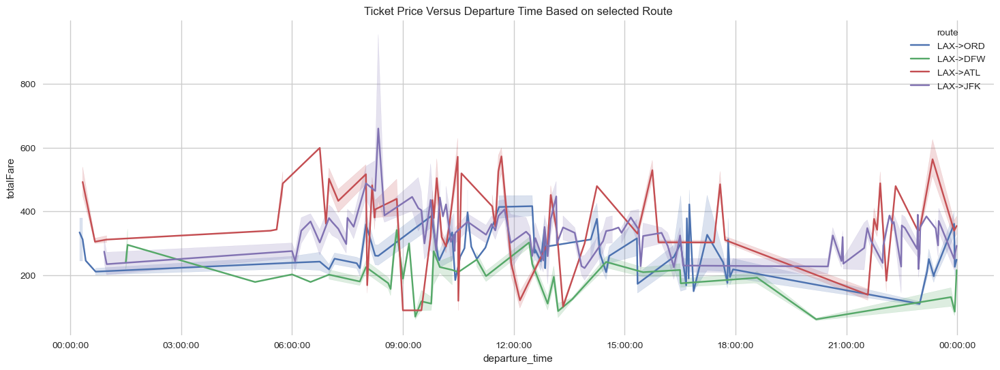

In [6]:
def plot_price_vs_time(df, name):
    fig, ax = plt.subplots(figsize=(18, 6))
    sns.lineplot(y="totalFare", x=name, data=df, hue='route')
    ax.set_xlim(df[name].min() - pd.Timedelta(1, 'h'),
                df[name].max() + pd.Timedelta(1, 'h'))
    ax.xaxis.set_major_formatter(md.DateFormatter('%H:%M:%S'))
    plt.title('Ticket Price Versus Departure Time Based on selected Route')
    plt.show()


plot_price_vs_time(coach_df_selected, name='departure_time')

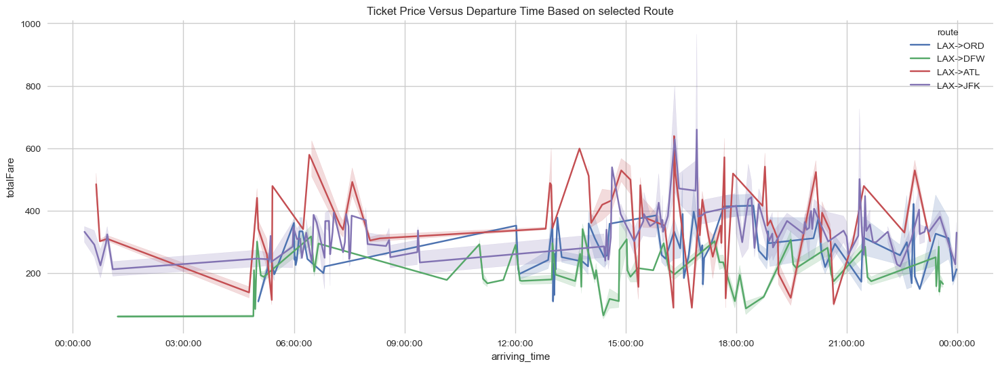

In [7]:
plot_price_vs_time(coach_df_selected, name='arriving_time')

Above plot indicating that we may split the departure time in groups, say 6-18, others.

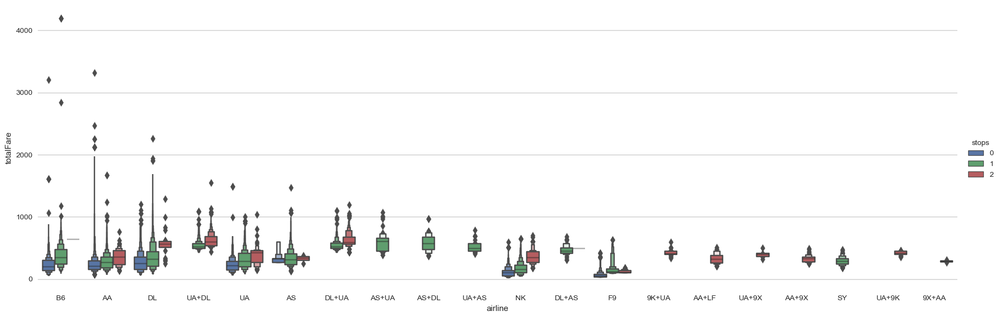

In [12]:
sns.catplot(y="totalFare", x="airline", data=eda_data.sort_values("totalFare", ascending=False), hue='stops',
            kind="boxen", height=6, aspect=3)
plt.show()

We need to indentify is the outlier always the bussines/ first, or on specific airline?

From the plot we find that the large price may not only depend on the class, but class is a viable variable.

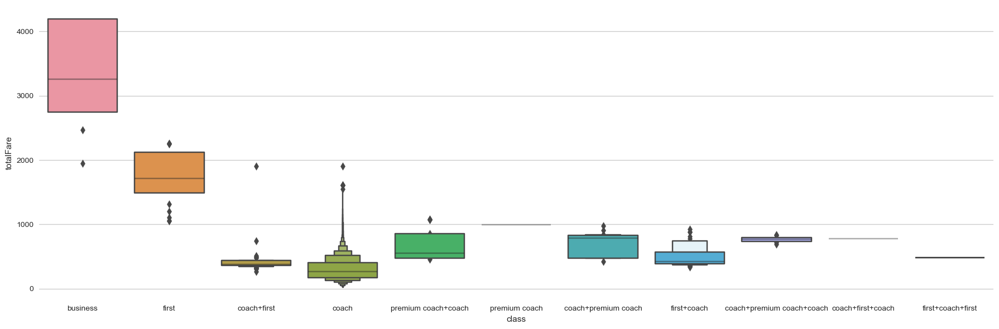

In [13]:
sns.catplot(y="totalFare", x="class", data=eda_data.sort_values("totalFare", ascending=False),
            kind="boxen", height=6,
            aspect=3)
plt.show()

Moreover, airline carry some key information on the distribution of prices, some are large, some are small. We shall call them 'outliers'

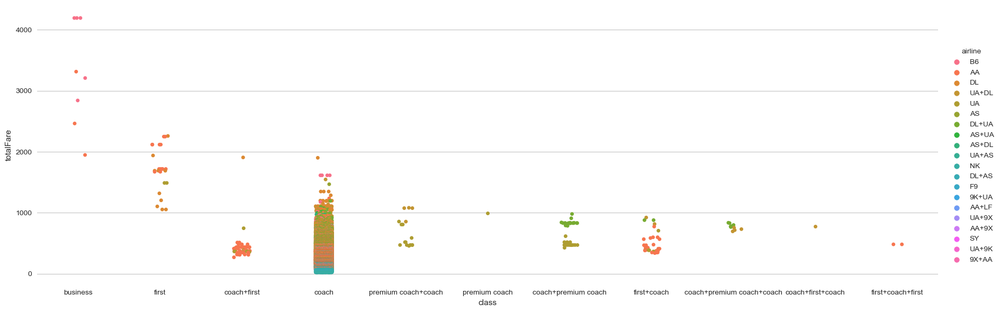

In [14]:
sns.catplot(y="totalFare", x="class", data=eda_data.sort_values("totalFare", ascending=False), hue='airline',
            height=6,
            aspect=3)
plt.show()

* Class vs totalFare indicating make a new feature isBusi_First

In [6]:
eda_data['air_route'] = eda_data['startingAirport'] + '->' + eda_data['destinationAirport']
eda_data

,days_to_depart,flight_day_of_week,startingAirport,destinationAirport,departure_time,arriving_time,isDeparture_time_6to18,isArriving_time_11to24,stops,route,...,elapsedDays,isBasicEconomy,isRefundable,isNonStop,seatsRemaining,totalTravelDistance,total_waiting_time,baseFare,totalFare,air_route
0,44,3,LAX,ORD,12:55:00,00:54:00,True,False,1,LAX->DFW->ORD,...,1,False,False,False,0,NaN,4.37,21.11,91.29,LAX->ORD
1,44,3,LAX,ORD,15:21:00,21:24:00,True,True,0,LAX->ORD,...,0,False,False,True,0,NaN,0.00,43.00,99.89,LAX->ORD
2,44,3,LAX,ORD,07:00:00,13:04:00,True,True,0,LAX->ORD,...,0,False,False,True,0,NaN,0.00,43.00,99.89,LAX->ORD
3,44,3,LAX,ORD,20:25:00,04:13:00,False,False,1,LAX->LAS->ORD,...,1,False,False,False,0,NaN,0.92,33.00,103.18,LAX->ORD
4,44,3,LAX,ORD,19:25:00,04:13:00,False,False,1,LAX->LAS->ORD,...,1,False,False,False,0,NaN,1.92,33.00,103.18,LAX->ORD
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
88784,53,5,ATL,ORD,11:18:00,16:05:00,True,True,1,ATL->DCA->ORD,...,0,False,False,False,7,1135.0,1.67,175.81,213.20,ATL->ORD
88785,53,5,ATL,ORD,12:24:00,17:15:00,True,True,1,ATL->DFW->ORD,...,0,False,False,False,7,1524.0,1.02,175.81,213.20,ATL->ORD
88786,53,5,ATL,ORD,11:42:00,17:49:00,True,True,1,ATL->JFK->ORD,...,0,False,False,False,7,1492.0,1.85,202.79,242.20,ATL->ORD
88787,53,5,ATL,ORD,17:45:00,18:59:00,True,True,0,ATL->ORD,...,0,False,False,True,9,600.0,0.00,226.98,258.90,ATL->ORD


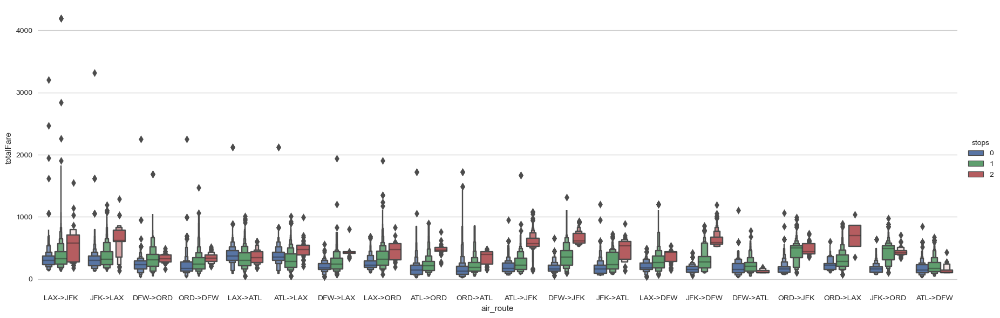

In [16]:
sns.catplot(y="totalFare", x="air_route", data=eda_data.sort_values("totalFare", ascending=False), hue='stops',
            kind="boxen",
            height=6,
            aspect=3)
plt.show()

In [17]:
fig = px.box(eda_data.sort_values("totalFare", ascending=False), y="totalFare", x='airline',
             color_discrete_sequence=["orange"], template='seaborn', height=400, width=900)
fig.show()

#### Check whether travel duration is an important factor to totalFare

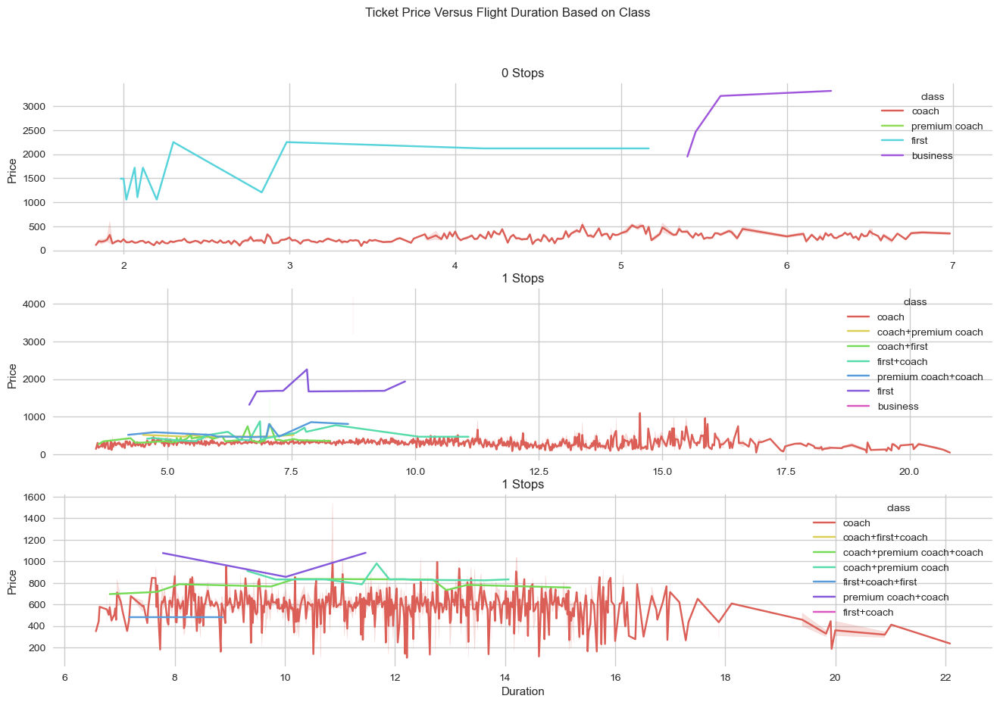

In [62]:
fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(16, 10))
fig.suptitle("Ticket Price Versus Flight Duration Based on Class")
ax1.title.set_text('0 Stops')
sns.lineplot(data=eda_data[eda_data['stops'] == 0], x='travelDuration_h', y='totalFare', hue='class', palette='hls',
             ax=ax1)
ax1.set_xlabel(None)
ax1.set_ylabel('Price')
ax2.title.set_text('1 Stops')
sns.lineplot(data=eda_data[eda_data['stops'] == 1], x='travelDuration_h', y='totalFare', hue='class', palette='hls',
             ax=ax2)
ax2.set_xlabel(None)
ax2.set_ylabel('Price')
ax3.title.set_text('1 Stops')
sns.lineplot(data=eda_data[eda_data['stops'] == 2], x='travelDuration_h', y='totalFare', hue='class', palette='hls',
             ax=ax3)
ax3.set_xlabel('Duration')
ax3.set_ylabel('Price')
plt.show()

#### Check whether days_to_depart is important to totalFare

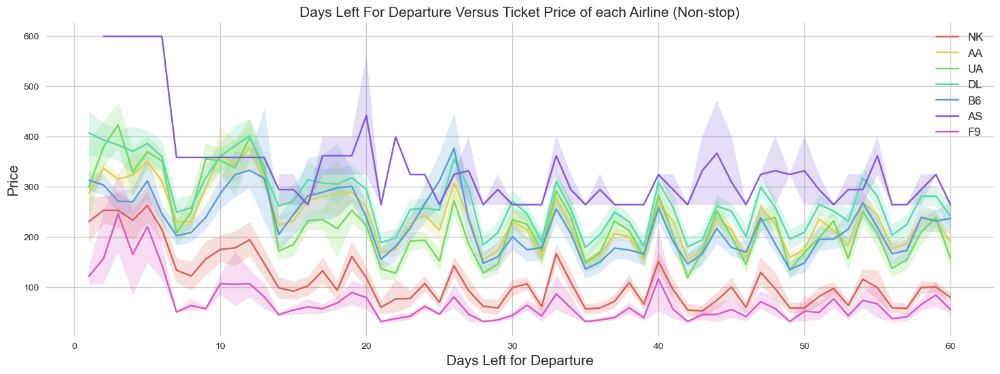

In [63]:
plt.figure(figsize=(18, 6))
sns.lineplot(data=eda_data[eda_data['stops'] == 0]
             , x='days_to_depart', y='totalFare', color='blue', hue='airline', palette='hls')
plt.title('Days Left For Departure Versus Ticket Price of each Airline (Non-stop)', fontsize=15)
plt.legend(fontsize=12)
plt.xlabel('Days Left for Departure', fontsize=15)
plt.ylabel('Price', fontsize=15)
plt.show()

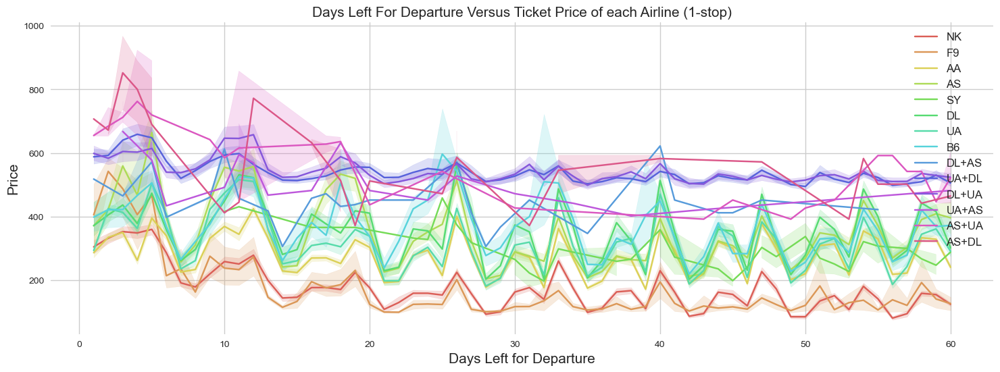

In [64]:
plt.figure(figsize=(18, 6))
sns.lineplot(data=eda_data[eda_data['stops'] == 1]
             , x='days_to_depart', y='totalFare', color='blue', hue='airline', palette='hls')
plt.title('Days Left For Departure Versus Ticket Price of each Airline (1-stop)', fontsize=15)
plt.legend(fontsize=12)
plt.xlabel('Days Left for Departure', fontsize=15)
plt.ylabel('Price', fontsize=15)
plt.show()

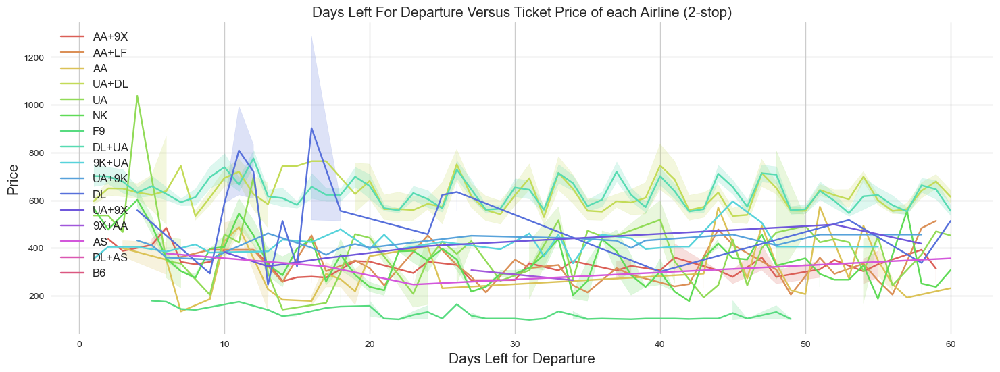

In [65]:
plt.figure(figsize=(18, 6))
sns.lineplot(data=eda_data[eda_data['stops'] == 2]
             , x='days_to_depart', y='totalFare', color='blue', hue='airline', palette='hls')
plt.title('Days Left For Departure Versus Ticket Price of each Airline (2-stop)', fontsize=15)
plt.legend(fontsize=12)
plt.xlabel('Days Left for Departure', fontsize=15)
plt.ylabel('Price', fontsize=15)
plt.show()

#### Check continuous data distribution

/var/folders/_j/x8h1yttn1s76k8f3bvjm72rw0000gn/T/ipykernel_90274/2615577386.py:3: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




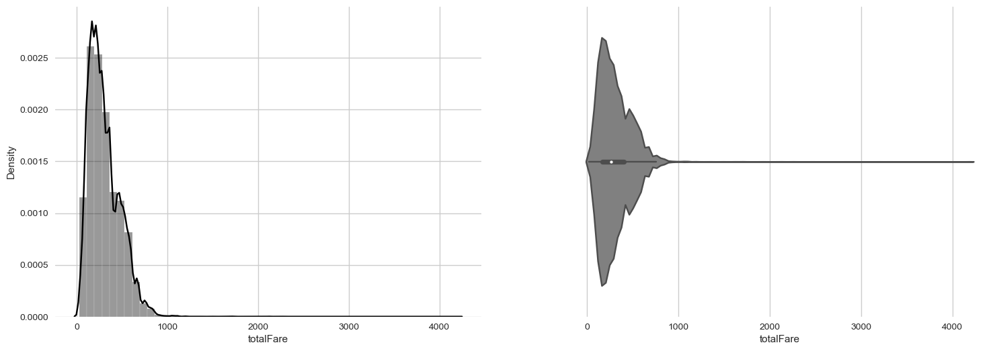

In [66]:
def plot_density(df, col):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 6))
    sns.distplot(df[col], ax=ax1, color='black')
    sns.violinplot(x=df[col], ax=ax2, color='grey')


plot_density(eda_data, 'totalFare')

#### Check correlation between features

In [7]:
eda_data_features = eda_data.drop('totalFare', axis=1)
eda_data_features = eda_data_features.drop('baseFare', axis=1)
eda_data_features = eda_data_features.drop('route', axis=1)
eda_data_features = eda_data_features.drop('departure_time', axis=1)
eda_data_features = eda_data_features.drop('arriving_time', axis=1)

In [8]:
bool_cols = eda_data_features.select_dtypes(include=['bool']).columns.tolist()
eda_data_features[bool_cols] = eda_data_features[bool_cols].astype(float)
cat_cols = eda_data_features.select_dtypes(include=['object']).columns
num_cols = eda_data_features.select_dtypes(include=['number']).columns
data_cat = eda_data_features[cat_cols]
data_num = eda_data_features[num_cols]

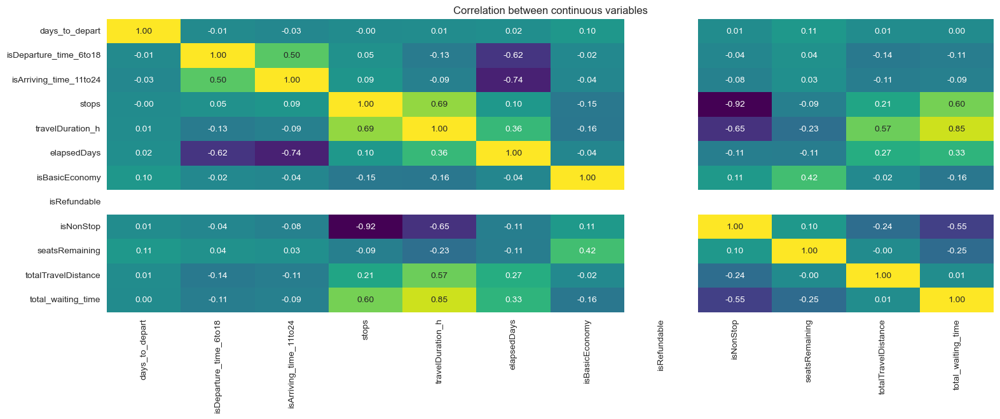

In [9]:
corr_num1 = data_num.corr()
plt.figure(figsize=(18, 6))
sns.heatmap(corr_num1, annot=True, fmt=".2f", cmap="viridis", cbar=False)
plt.title('Correlation between continuous variables')
plt.show()

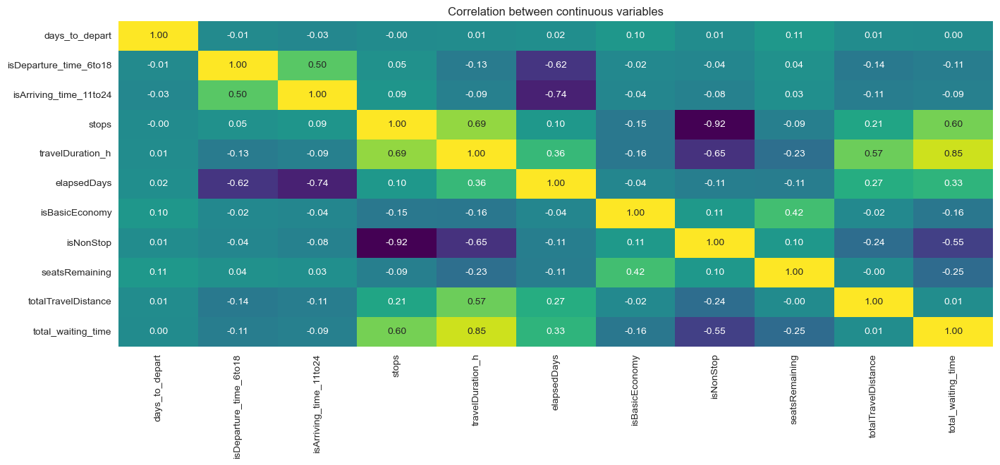

In [11]:
corr_num1 = data_num.drop('isRefundable', axis=1).corr()
plt.figure(figsize=(16, 6))
sns.heatmap(corr_num1, annot=True, fmt=".2f", cmap="viridis",cbar=False)
plt.title('Correlation between continuous variables')
plt.show()

Noticed that isRefundable is always 0, the reason is the value of this variable is always 0, should be dropped.

Also noticed that 'total_waiting_time' and 'travel_duration' have high correlation.

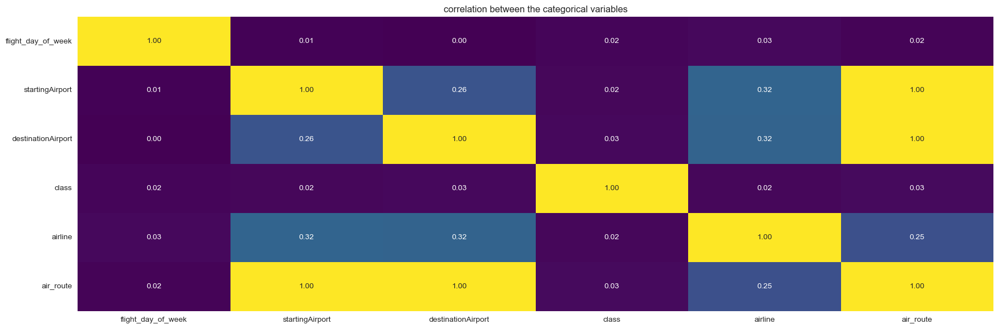

flight_day_of_week     7
startingAirport        5
destinationAirport     5
class                 11
airline               20
air_route             20
dtype: int64

In [12]:
from scipy.stats import chi2_contingency


def cramers_v(x, y):
    confusion_matrix = pd.crosstab(x, y)
    chi2 = chi2_contingency(confusion_matrix)[0]
    n = confusion_matrix.sum().sum()
    phi2 = chi2 / n
    r, k = confusion_matrix.shape
    phi2corr = max(0, phi2 - ((k - 1) * (r - 1)) / (n - 1))
    rcorr = r - ((r - 1) ** 2) / (n - 1)
    kcorr = k - ((k - 1) ** 2) / (n - 1)
    return np.sqrt(phi2corr / min((kcorr - 1), (rcorr - 1)))


corr_cate = np.zeros((len(data_cat.columns), len(data_cat.columns)))
for i, col1 in enumerate(data_cat.columns):
    for j, col2 in enumerate(data_cat.columns):
        corr_cate[i, j] = cramers_v(data_cat[col1], data_cat[col2])

corr_df_cate = pd.DataFrame(corr_cate, columns=data_cat.columns, index=data_cat.columns)
plt.figure(figsize=(18, 6))
sns.heatmap(corr_df_cate, annot=True, fmt=".2f", cmap="viridis",cbar=False)
plt.title('correlation between the categorical variables')
plt.tight_layout()
plt.show()
data_cat.nunique()

In [71]:
eda_data_features

,days_to_depart,flight_day_of_week,startingAirport,destinationAirport,isDeparture_time_6to18,isArriving_time_11to24,stops,class,airline,travelDuration_h,elapsedDays,isBasicEconomy,isRefundable,isNonStop,seatsRemaining,totalTravelDistance,total_waiting_time,air_route
0,44,3,LAX,ORD,1.0,0.0,1,coach,NK,9.983333,1,0.0,0.0,0.0,0,NaN,4.37,LAX->ORD
1,44,3,LAX,ORD,1.0,1.0,0,coach,NK,4.050000,0,0.0,0.0,1.0,0,NaN,0.00,LAX->ORD
2,44,3,LAX,ORD,1.0,1.0,0,coach,NK,4.066667,0,0.0,0.0,1.0,0,NaN,0.00,LAX->ORD
3,44,3,LAX,ORD,0.0,0.0,1,coach,NK,5.800000,1,0.0,0.0,0.0,0,NaN,0.92,LAX->ORD
4,44,3,LAX,ORD,0.0,0.0,1,coach,NK,6.800000,1,0.0,0.0,0.0,0,NaN,1.92,LAX->ORD
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
88784,53,5,ATL,ORD,1.0,1.0,1,coach,AA,5.783333,0,0.0,0.0,0.0,7,1135.0,1.67,ATL->ORD
88785,53,5,ATL,ORD,1.0,1.0,1,coach,AA,5.850000,0,0.0,0.0,0.0,7,1524.0,1.02,ATL->ORD
88786,53,5,ATL,ORD,1.0,1.0,1,coach,B6,7.116667,0,0.0,0.0,0.0,7,1492.0,1.85,ATL->ORD
88787,53,5,ATL,ORD,1.0,1.0,0,coach,DL,2.233333,0,0.0,0.0,1.0,9,600.0,0.00,ATL->ORD


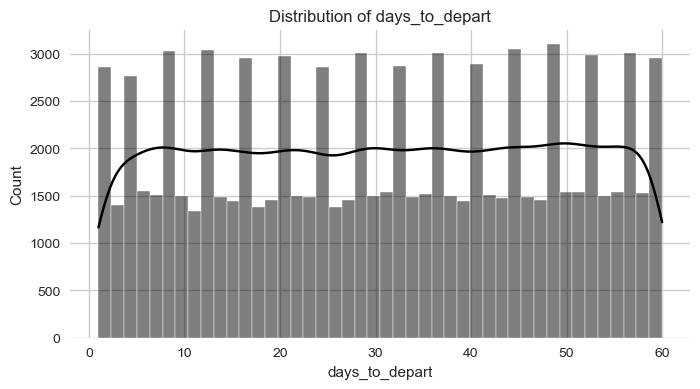

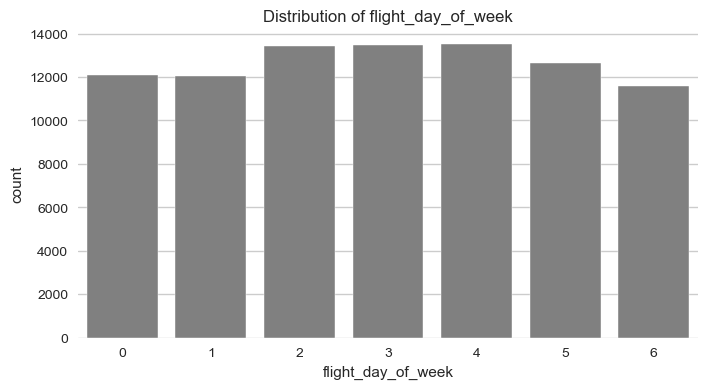

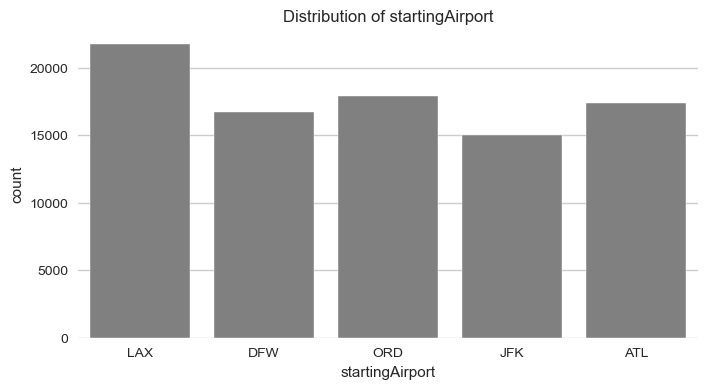

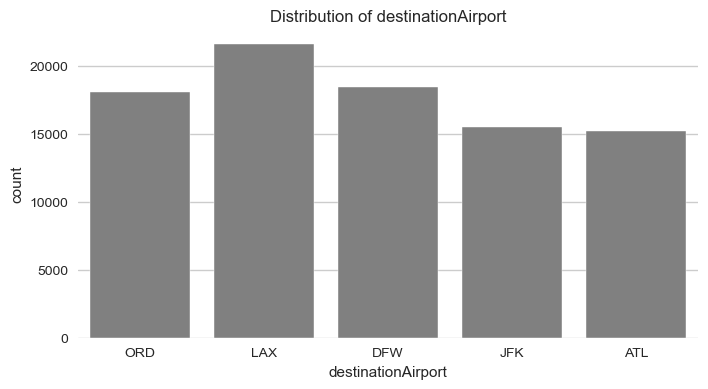

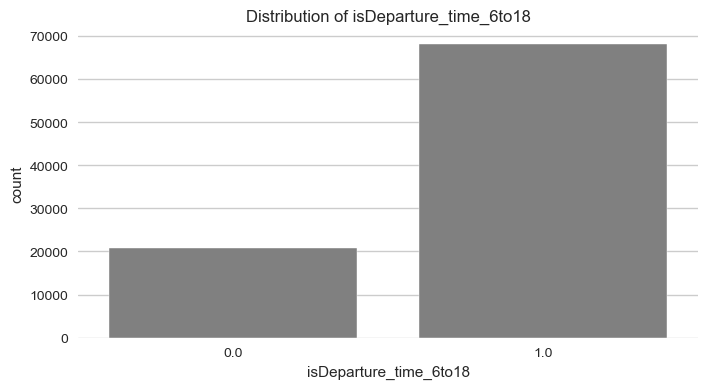

...

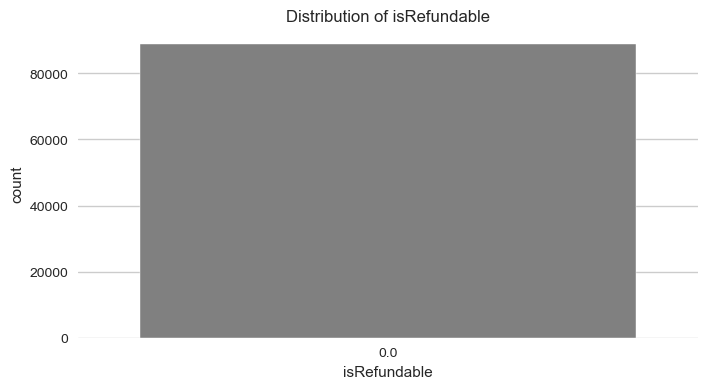

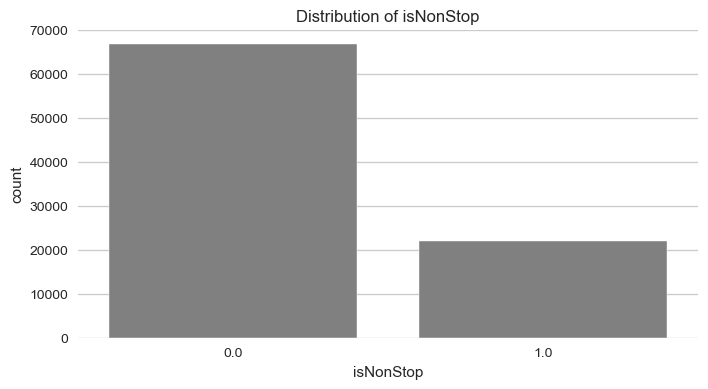

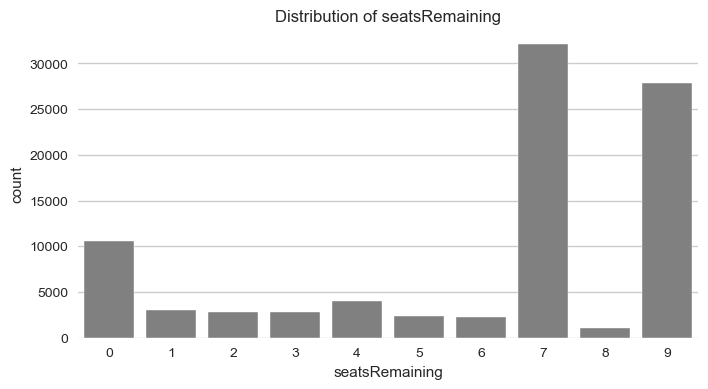

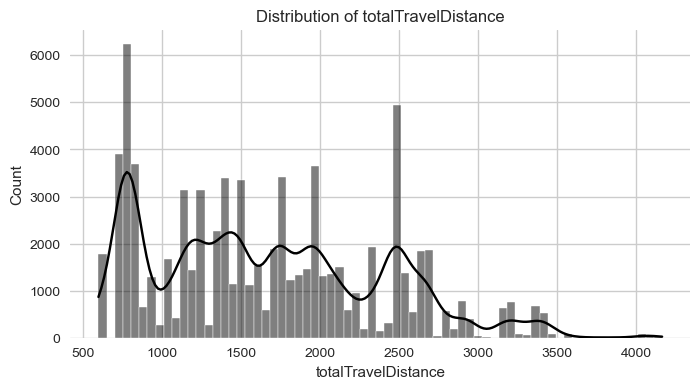

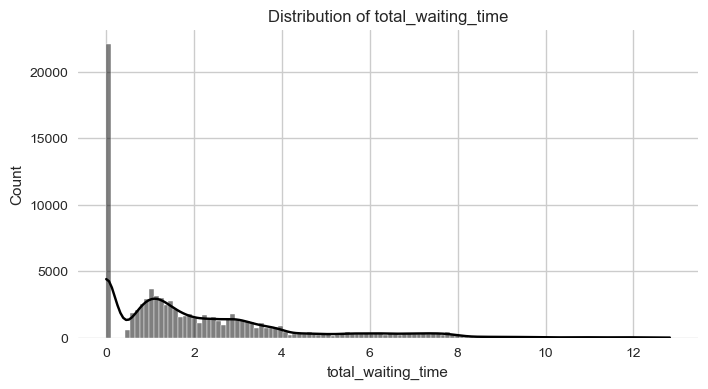

In [73]:
def plot_distributions(df):
    cols = df.columns.tolist()
    for col in cols:
        plt.figure(figsize=(8, 4))
        if df[col].nunique() >= 30:
            sns.histplot(x=col, data=df, kde=True, color='black')
        else:
            sns.countplot(x=col, data=df, color='grey')
        plt.title(f"Distribution of {col}")
        plt.show()


plot_distributions(eda_data_features.drop('air_route', axis=1))